In [150]:
import pandas as pd
import numpy as np
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

## LATIHAN 1 - LOADING AND EXPLORING DATASET

Memberikan nama pada setiap kolom data
Print 5 data pertama

In [151]:
column_names = ['CRIME', 'ZN', 'INDUS', 'CHAS', 'NOx', 'RM', 'AGE', 'DISTANCE', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'MEDV']
data = pd.read_csv('boston housing.csv', header=1, delimiter=r"\s+", names=column_names)
print(data.head(5))

     CRIME    ZN  INDUS  CHAS    NOx     RM   AGE  DISTANCE  RAD    TAX  \
0  0.02729   0.0   7.07     0  0.469  7.185  61.1    4.9671    2  242.0   
1  0.03237   0.0   2.18     0  0.458  6.998  45.8    6.0622    3  222.0   
2  0.06905   0.0   2.18     0  0.458  7.147  54.2    6.0622    3  222.0   
3  0.02985   0.0   2.18     0  0.458  6.430  58.7    6.0622    3  222.0   
4  0.08829  12.5   7.87     0  0.524  6.012  66.6    5.5605    5  311.0   

   PTRATIO       B  LSTAT  MEDV  
0     17.8  392.83   4.03  34.7  
1     18.7  394.63   2.94  33.4  
2     18.7  396.90   5.33  36.2  
3     18.7  394.12   5.21  28.7  
4     15.2  395.60  12.43  22.9  


Mencetak info dari dataset, dimana dapat dilihat ada 504 baris atau data yang ada pada dataset, dimana ada 14 total kolom, dengan tipe data int dan float

In [152]:
print(data.info())
print('\n')
print(data.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 504 entries, 0 to 503
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CRIME     504 non-null    float64
 1   ZN        504 non-null    float64
 2   INDUS     504 non-null    float64
 3   CHAS      504 non-null    int64  
 4   NOx       504 non-null    float64
 5   RM        504 non-null    float64
 6   AGE       504 non-null    float64
 7   DISTANCE  504 non-null    float64
 8   RAD       504 non-null    int64  
 9   TAX       504 non-null    float64
 10  PTRATIO   504 non-null    float64
 11  B         504 non-null    float64
 12  LSTAT     504 non-null    float64
 13  MEDV      504 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.2 KB
None


            CRIME          ZN       INDUS        CHAS         NOx          RM  \
count  504.000000  504.000000  504.000000  504.000000  504.000000  504.000000   
mean     3.627796   11.373016   11.162361    0.069

## LATIHAN 2 - DATA PREPROCESSING FOR REGRESSION

In [153]:
# data.tail()

In [154]:
print(data.items())

<generator object DataFrame.items at 0x0000022AB6872D40>


In [155]:
data = data[~(data['MEDV'] >= 50.0)]
print(np.shape(data))

(488, 14)


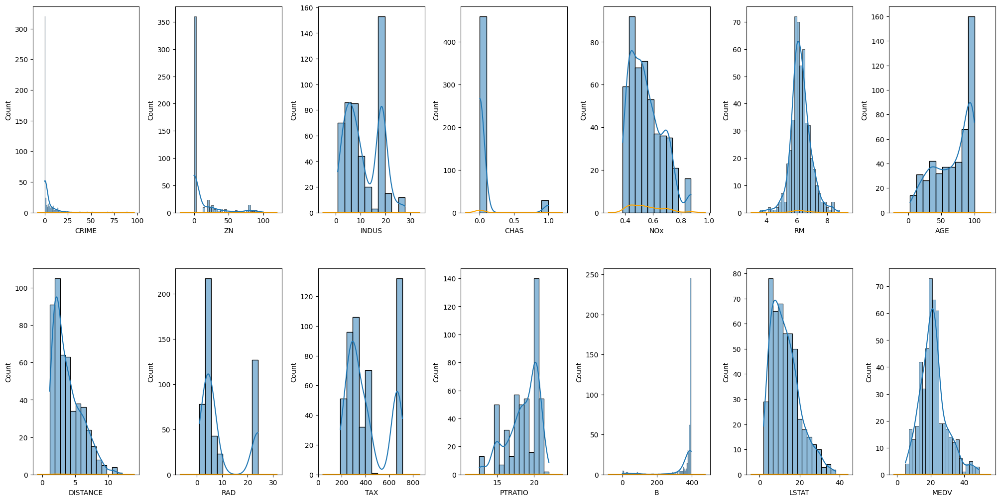

In [156]:
fig, axs = plt.subplots(ncols=7, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()

for k, v in data.items():
    sns.histplot(v, ax=axs[index], kde=True)
    sns.kdeplot(v, ax=axs[index], color='orange')
    index += 1

plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)
plt.show()

<Axes: >

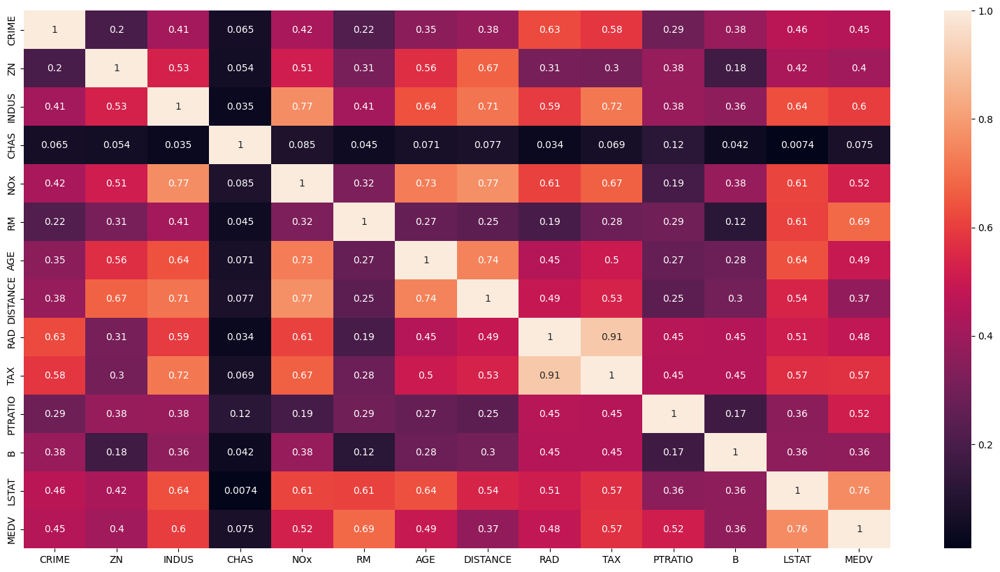

In [157]:
plt.figure(figsize=(20, 10))
sns.heatmap(data.corr().abs(),  annot=True)

## LATIHAN 3 - LINEAR REGRESSION MODEL

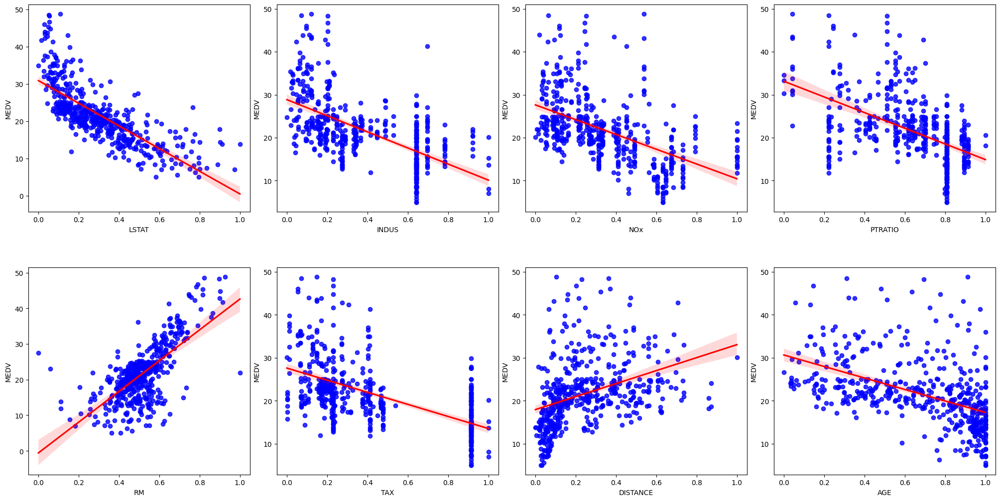

In [158]:
from sklearn import preprocessing
# Let's scale the columns before plotting them against MEDV
min_max_scaler = preprocessing.MinMaxScaler()
column_sels = ['LSTAT', 'INDUS', 'NOx', 'PTRATIO', 'RM', 'TAX', 'DISTANCE', 'AGE']
x = data.loc[:,column_sels]
y = data['MEDV']
x = pd.DataFrame(data=min_max_scaler.fit_transform(x), columns=column_sels)
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for i, k in enumerate(column_sels):
    sns.regplot(y=y, x=x[k], ax=axs[i], scatter_kws={'color': 'blue'}, line_kws={'color': 'red'})
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

In [159]:
y =  np.log1p(y)
for col in x.columns:
    if np.abs(x[col].skew()) > 0.3:
        x[col] = np.log1p(x[col])

In [160]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import MinMaxScaler
import numpy as np

l_regression = linear_model.LinearRegression()
kf = KFold(n_splits=10)
min_max_scaler = MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
scores = cross_val_score(l_regression, x_scaled, y, cv=kf, scoring='neg_mean_squared_error')
print("Mean MSE: %0.2f" % (scores.mean()))



Mean MSE: -0.04


In [161]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

svr_rbf = SVR(kernel='rbf', C=1e3, gamma=0.1)
#grid_sv = GridSearchCV(svr_rbf, cv=kf, param_grid={"C": [1e0, 1e1, 1e2, 1e3], "gamma": np.logspace(-2, 2, 5)}, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)
scores = cross_val_score(svr_rbf, x_scaled, y, cv=kf, scoring='neg_mean_squared_error')
scores_map['SVR'] = scores
print("Mean MSE: %0.2f" % (scores.mean()))

Mean MSE: -0.04


In [162]:
from sklearn.tree import DecisionTreeRegressor

desc_tr = DecisionTreeRegressor(max_depth=5)
#grid_sv = GridSearchCV(desc_tr, cv=kf, param_grid={"max_depth" : [1, 2, 3, 4, 5, 6, 7]}, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)
scores = cross_val_score(desc_tr, x_scaled, y, cv=kf, scoring='neg_mean_squared_error')
scores_map['DecisionTreeRegressor'] = scores
print("MSE: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

MSE: -0.05 (+/- 0.03)


In [163]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=7)
scores = cross_val_score(knn, x_scaled, y, cv=kf, scoring='neg_mean_squared_error')
scores_map['KNeighborsRegressor'] = scores
#grid_sv = GridSearchCV(knn, cv=kf, param_grid={"n_neighbors" : [2, 3, 4, 5, 6, 7]}, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)
print("KNN Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

KNN Accuracy: -0.04 (+/- 0.03)


In [164]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(alpha=0.9,learning_rate=0.05, max_depth=2, min_samples_leaf=5, min_samples_split=2, n_estimators=100, random_state=30)
#param_grid={'n_estimators':[100, 200], 'learning_rate': [0.1,0.05,0.02], 'max_depth':[2, 4,6], 'min_samples_leaf':[3,5,9]}
#grid_sv = GridSearchCV(gbr, cv=kf, param_grid=param_grid, scoring='neg_mean_squared_error')
#grid_sv.fit(x_scaled, y)
#print("Best classifier :", grid_sv.best_estimator_)
scores = cross_val_score(gbr, x_scaled, y, cv=kf, scoring='neg_mean_squared_error')
scores_map['GradientBoostingRegressor'] = scores
print("MSE: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std()))

MSE: -0.03 (+/- 0.02)


<Axes: >

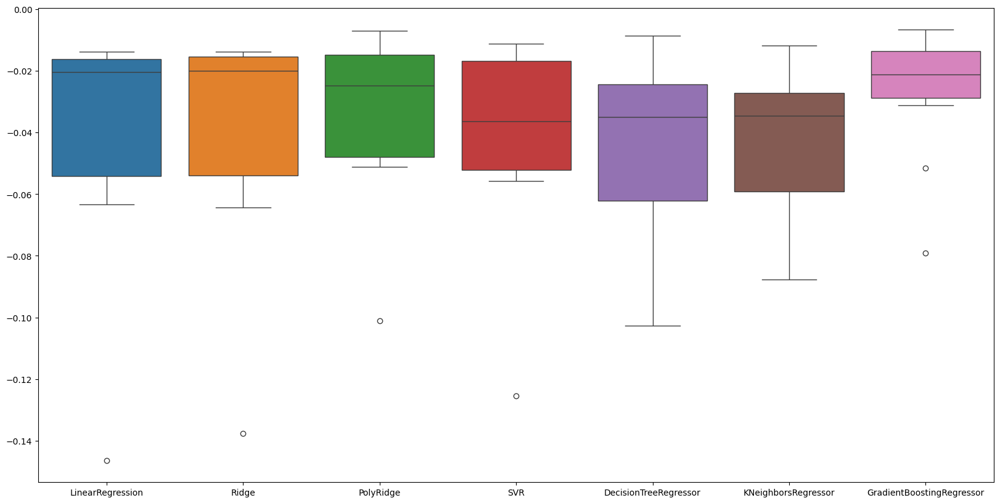

In [165]:
plt.figure(figsize=(20, 10))
scores_map = pd.DataFrame(scores_map)
sns.boxplot(data=scores_map)

## DECISION TREE REGRESSION

In [166]:
X = data.drop(columns=['MEDV', 'RAD'], axis='column')

In [167]:
X.columns

Index(['CRIME', 'ZN', 'INDUS', 'CHAS', 'NOx', 'RM', 'AGE', 'DISTANCE', 'TAX',
       'PTRATIO', 'B', 'LSTAT'],
      dtype='object')

In [168]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=2)

In [169]:
# print(y_train)
# print('\n')
# print(y_test)

In [170]:
from sklearn.tree import DecisionTreeRegressor
DT = DecisionTreeRegressor(max_depth = 2)
DT.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=2)

In [171]:
DT_params = {'max_depth': range(1,11)}
DT_grid_search = GridSearchCV(estimator = DT, param_grid = DT_params, cv=10,return_train_score = True )
DT_grid_search.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(max_depth=2),
             param_grid={'max_depth': range(1, 11)}, return_train_score=True)

In [172]:
DT_cv_results = pd.DataFrame(DT_grid_search.cv_results_)
DT_cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,split2_train_score,split3_train_score,split4_train_score,split5_train_score,split6_train_score,split7_train_score,split8_train_score,split9_train_score,mean_train_score,std_train_score
0,0.001772,0.000652,0.001027,0.000588,1,{'max_depth': 1},0.390833,0.465931,0.400718,0.532786,...,0.452027,0.438063,0.458650,0.456379,0.460590,0.459553,0.436111,0.457495,0.452126,0.008358
1,0.002701,0.000861,0.001287,0.000430,2,{'max_depth': 2},0.567791,0.703976,0.714335,0.781609,...,0.707279,0.700312,0.713708,0.721113,0.738451,0.723074,0.714475,0.704665,0.715403,0.010616
2,0.002950,0.001251,0.001199,0.000309,3,{'max_depth': 3},0.680024,0.748945,0.789007,0.781653,...,0.789755,0.787226,0.796342,0.815728,0.823829,0.803512,0.818163,0.789783,0.803841,0.012371
3,0.003189,0.000530,0.001421,0.000517,4,{'max_depth': 4},0.700723,0.785179,0.848913,0.790585,...,0.860966,0.855852,0.856951,0.880699,0.881075,0.871856,0.865466,0.858452,0.866959,0.008845
4,0.003188,0.000681,0.001650,0.000618,5,{'max_depth': 5},0.750061,0.812847,0.827770,0.815815,...,0.908482,0.899282,0.901934,0.916181,0.924931,0.914668,0.906606,0.895236,0.908940,0.008322
5,0.003440,0.000462,0.000963,0.000591,6,{'max_depth': 6},0.765037,0.781561,0.852425,0.853786,...,0.947881,0.937102,0.937784,0.941948,0.947617,0.943032,0.940834,0.932211,0.940863,0.004505
6,0.003964,0.000542,0.001502,0.000448,7,{'max_depth': 7},0.728329,0.839708,0.859925,0.827891,...,0.970030,0.960722,0.960344,0.964473,0.964009,0.964195,0.963781,0.958443,0.962535,0.003283
7,0.003943,0.000552,0.001297,0.000398,8,{'max_depth': 8},0.680114,0.833438,0.810928,0.863206,...,0.982748,0.973523,0.974505,0.976885,0.977103,0.975843,0.976037,0.975098,0.975976,0.002694
8,0.004487,0.000366,0.001076,0.000103,9,{'max_depth': 9},0.684940,0.761687,0.816267,0.883896,...,0.991200,0.984582,0.981595,0.985270,0.985533,0.984133,0.984163,0.986246,0.984739,0.002757
9,0.004715,0.000383,0.001256,0.000416,10,{'max_depth': 10},0.677023,0.759313,0.810181,0.872227,...,0.996938,0.991921,0.989163,0.990866,0.991576,0.992683,0.990079,0.993828,0.991594,0.002477


In [173]:
DT_cv_results[['params','mean_train_score','mean_test_score']]

,params,mean_train_score,mean_test_score
0,{'max_depth': 1},0.452126,0.410584
1,{'max_depth': 2},0.715403,0.639021
2,{'max_depth': 3},0.803841,0.671878
3,{'max_depth': 4},0.866959,0.699280
4,{'max_depth': 5},0.908940,0.715469
5,{'max_depth': 6},0.940863,0.700905
6,{'max_depth': 7},0.962535,0.681655
7,{'max_depth': 8},0.975976,0.667802
8,{'max_depth': 9},0.984739,0.650438
9,{'max_depth': 10},0.991594,0.652493


Mean Test Scores:
[0.41058443 0.63902067 0.67187793 0.69927966 0.71546942 0.70090501
 0.68165517 0.66780193 0.65043761 0.65249298]

Mean Train Scores:
[0.45212638 0.71540331 0.80384079 0.8669591  0.90894035 0.94086313
 0.96253548 0.97597577 0.98473896 0.99159352]


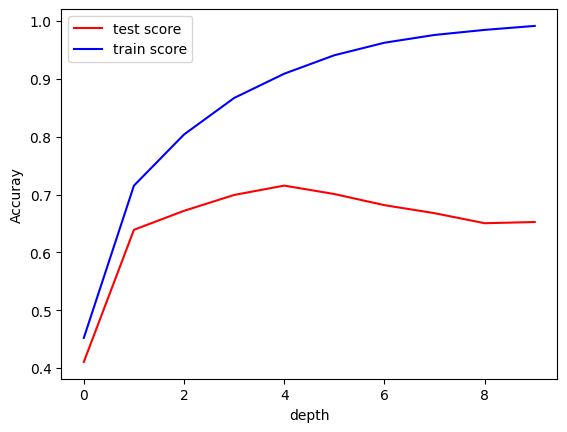

In [174]:
plt.plot(DT_grid_search.cv_results_['mean_test_score'], color='red')
plt.plot(DT_grid_search.cv_results_['mean_train_score'], color='blue')
plt.legend(['test score', 'train score'], loc='upper left')
plt.xlabel('depth')
plt.ylabel('Accuray')

print("Mean Test Scores:")
print(DT_grid_search.cv_results_['mean_test_score'])
print("\nMean Train Scores:")
print(DT_grid_search.cv_results_['mean_train_score'])


In [175]:
DT = DT_grid_search.best_estimator_
DT

DecisionTreeRegressor(max_depth=5)

In [176]:
DT_cv_score = DT_grid_search.best_score_
DT_cv_score

0.715469424867813

In [177]:
DT.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=5)

In [178]:
DT_predictions = DT.predict(X_test)

In [179]:
from sklearn import tree

fig = plt.figure(figsize=(300,300))
_ = tree.plot_tree(DT, feature_names= ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'TAX',
                                   'PTRATIO', 'B', 'LSTAT'],  
                   class_names=['MEDV'],
                   filled=True, node_ids = True)

In [180]:
from sklearn.metrics import mean_squared_error
DT_RMSE = np.sqrt(mean_squared_error(y_test, DT_predictions))
print(DT_RMSE)

0.19931318886987298


In [181]:
Models_eval = []
Models_eval.append(('Decision Tree',DT_RMSE,np.mean(DT_cv_score)))
Models_eval

[('Decision Tree', 0.19931318886987298, 0.715469424867813)]

<Axes: title={'center': 'Feature Importance'}>

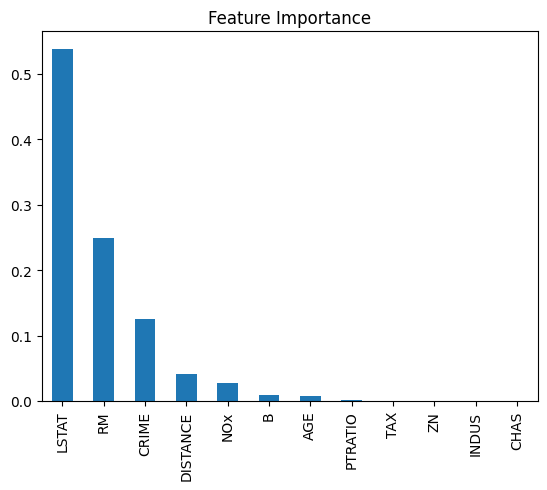

In [182]:
coef = pd.Series(DT.feature_importances_, X.columns).sort_values(ascending=False)
coef.plot(kind='bar', title='Feature Importance')

In [183]:
# import matplotlib.pyplot as plt
# from sklearn.datasets import load_boston

# # Memuat dataset Boston Housing
# boston_dataset = load_boston()
# data = boston_dataset['target']  # Mengambil target variabel (harga rumah) dari dataset

# # Membuat histogram dari harga rumah
# plt.figure(figsize=(8, 6))
# plt.hist(data, bins=30, color='skyblue', edgecolor='black')  # Membuat histogram dengan 30 bins
# plt.title('Distribution of House Prices in Boston')
# plt.xlabel('Price')
# plt.ylabel('Frequency')
# plt.show()
